In [504]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from glob import glob

In [573]:
# read images
image_names = glob("../data/split_162930/*.jpg")
# image_names = glob("../data/split_fine/*.jpg")
# image_names = glob("../data/stitching/boat*.jpg")
# image_names = glob("../data/test1/DSC_*.jpg")
imgs = []
for i in image_names:
    _i = cv2.imread(i)
    _i = cv2.rotate(_i, cv2.ROTATE_90_CLOCKWISE )
    # _i = cv.resize(_i, (0,0), fx=0.25, fy=0.25)
    imgs.append(_i)
# return imgs, image_names

In [574]:
# params for ShiTomasi corner detection
feature_params = dict( maxCorners = 100,
                       qualityLevel = 0.3,
                       minDistance = 7,
                       blockSize = 7 )

# Parameters for lucas kanade optical flow
lk_params = dict( winSize  = (15,15),
                  maxLevel = 4,
                  criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))

In [575]:
def warp_img0(src, good0, good1):
    ph, mask = cv2.findHomography(good1, good0, cv2.RANSAC, 5.0)
    # Find the corners after the transform has been applied

    height, width = src.shape
    corners = np.array([
      [0, 0],
      [0, height - 1],
      [width - 1, height - 1],
      [width - 1, 0]
    ])
    corners = cv2.perspectiveTransform(np.float32([corners]), ph)[0]

    # Find the bounding rectangle
    bx, by, bwidth, bheight = cv2.boundingRect(corners)

    # Compute the translation homography that will move (bx, by) to (0, 0)
    th = np.array([
      [ 1, 0, -bx ],
      [ 0, 1, -by ],
      [ 0, 0,   1 ]
    ])

    # Combine the homographies
    pth = ph.dot(th)

    # Apply the transformation to the image
    warped = cv2.warpPerspective(src, pth, (bwidth, bheight), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_CONSTANT)
    return warped

In [583]:
def warpTwoImages(img1, img2, H):
    '''warp img2 to img1 with homograph H'''
    h1,w1 = img1.shape[:2]
    h2,w2 = img2.shape[:2]
    pts1 = np.float32([[0,0],[0,h1],[w1,h1],[w1,0]]).reshape(-1,1,2)
    pts2 = np.float32([[0,0],[0,h2],[w2,h2],[w2,0]]).reshape(-1,1,2)
    pts2_ = cv2.perspectiveTransform(pts2, H)
    pts = np.concatenate((pts1, pts2_), axis=0)
    [xmin, ymin] = np.int32(pts.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int32(pts.max(axis=0).ravel() + 0.5)
    t = [-xmin,-ymin]
    Ht = np.array([[1,0,t[0]],[0,1,t[1]],[0,0,1]]) # translate

    result = cv2.warpPerspective(img2, Ht.dot(H), (xmax-xmin, ymax-ymin))
    result[t[1]:h1+t[1],t[0]:w1+t[0]] = img1
    rect = np.int32([t[1], h2+t[1],t[0], w2+t[0]])
    return result, rect

In [577]:
def warpTwoImagesInv(img1, img2, H_inv):
    '''warp img2 to img1 with homograph H'''
    h1,w1 = img1.shape[:2]
    h2,w2 = img2.shape[:2]
    pts1 = np.float32([[0,0],[0,h1],[w1,h1],[w1,0]]).reshape(-1,1,2)
    pts2 = np.float32([[0,0],[0,h2],[w2,h2],[w2,0]]).reshape(-1,1,2)
    pts1_ = cv2.perspectiveTransform(pts1, H_inv)
    pts = np.concatenate((pts1_, pts2), axis=0)
    [xmin, ymin] = np.int32(pts.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int32(pts.max(axis=0).ravel() + 0.5)
    t = [-xmin, -ymin]
    Ht = np.array([[1,0,t[0]],[0,1,t[1]],[0,0,1]]) # translate

    result = cv2.warpPerspective(img1, Ht.dot(H_inv), (xmax-xmin, ymax-ymin))
    result[t[1]:h2+t[1],t[0]:w2+t[0]] = img2
    rect = np.int32([t[1], h2+t[1],t[0], w2+t[0]])
    return result, rect

0 1


<ipython-input-585-3c7f40ceaa6f>:31: DeprecationWarning: an integer is required (got type numpy.float32).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  cv2.circle(_i, tuple(p), 15, (255,0,0), 2)
<ipython-input-585-3c7f40ceaa6f>:40: DeprecationWarning: an integer is required (got type numpy.float32).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  cv2.circle(_j, tuple(p), 15, (255,0,0), 2)
<ipython-input-585-3c7f40ceaa6f>:44: DeprecationWarning: an integer is required (got type numpy.float32).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  cv2.circle(_k, tuple(p), 15, (255,0,0), 2)


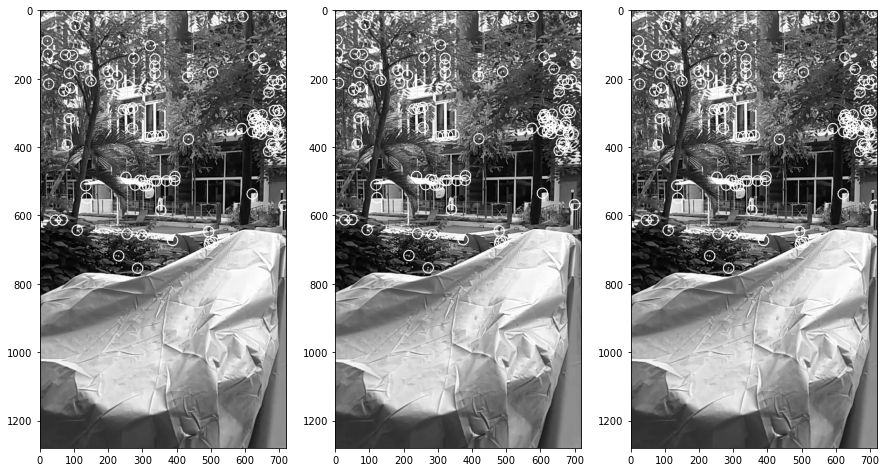

1 2


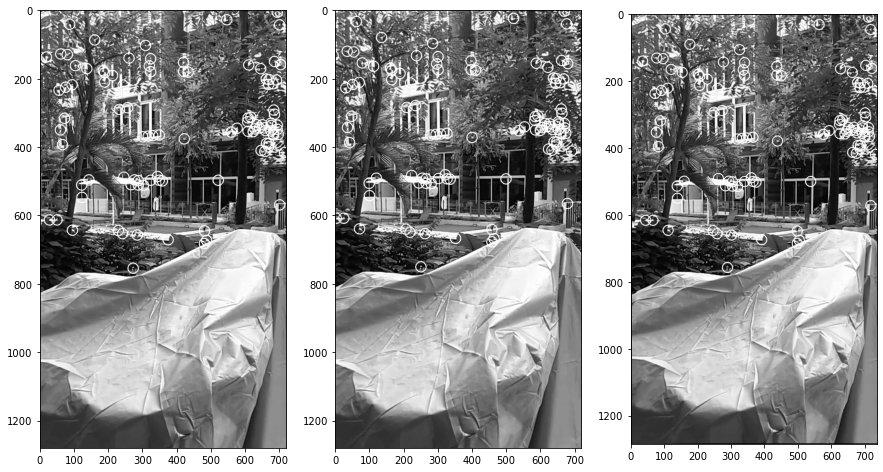

2 3


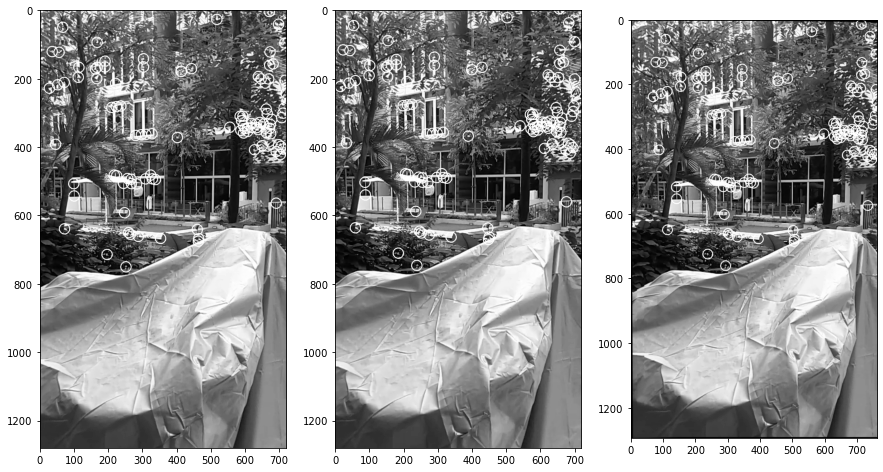

3 4


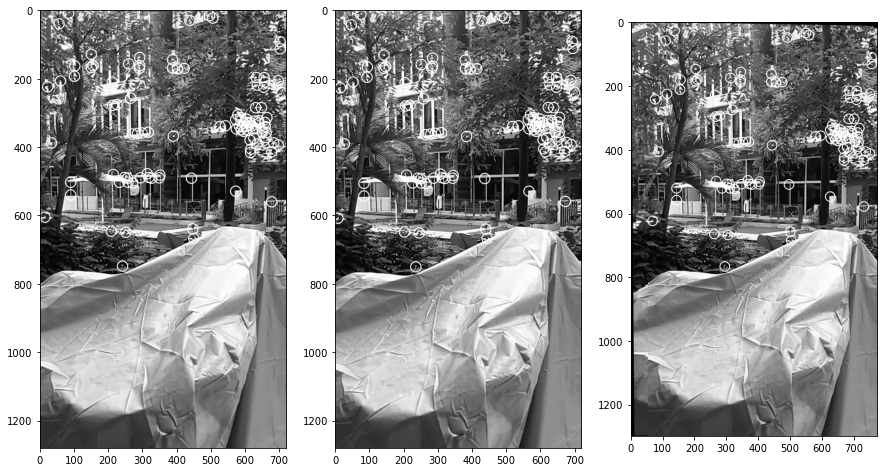

4 5


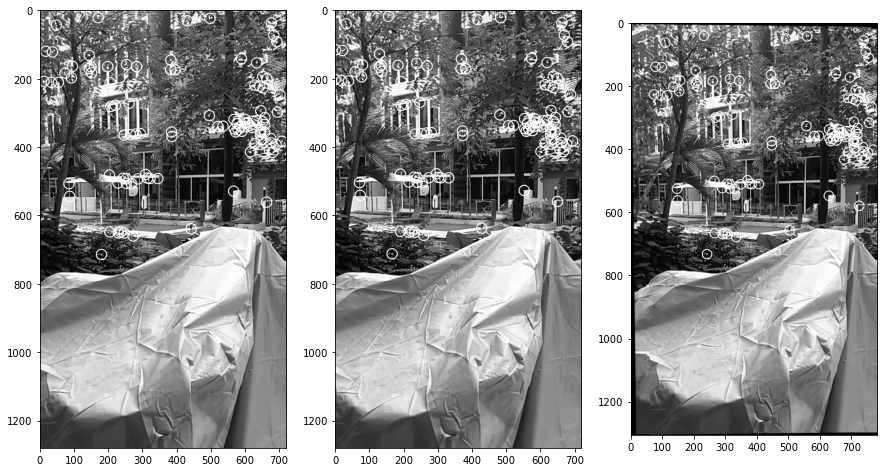

5 6


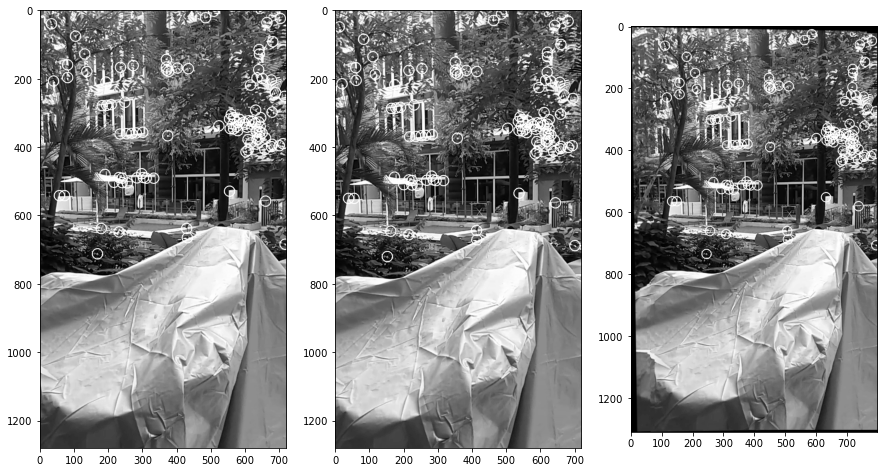

6 7


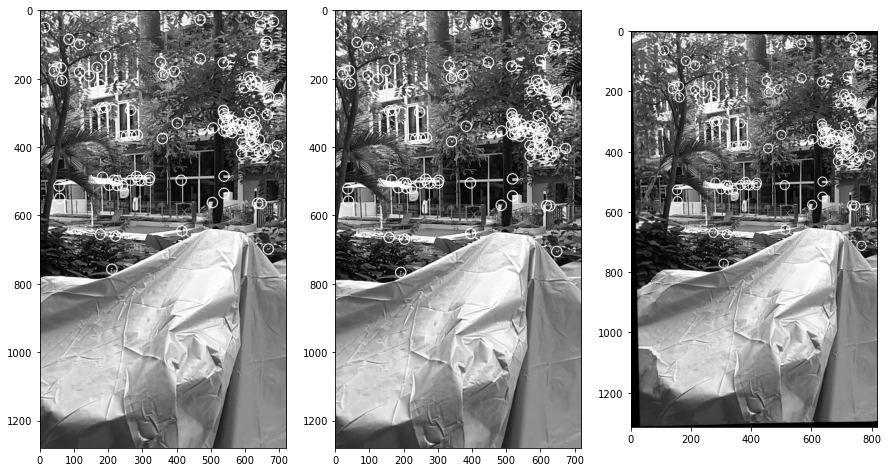

7 8


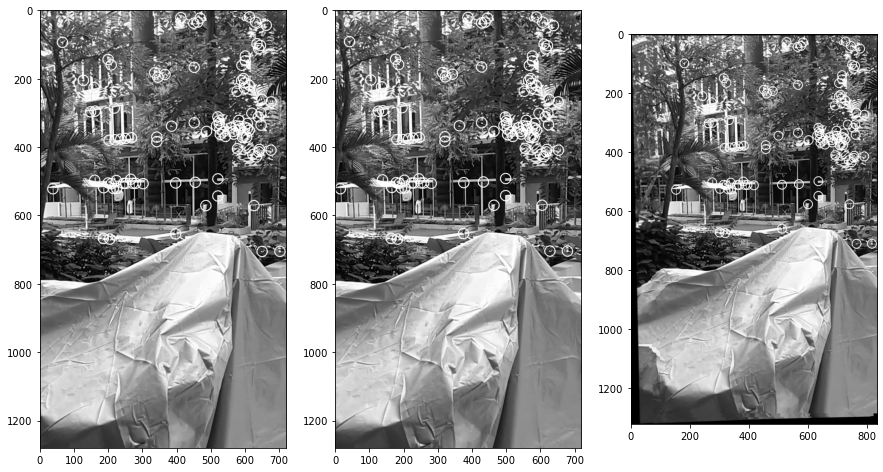

8 9


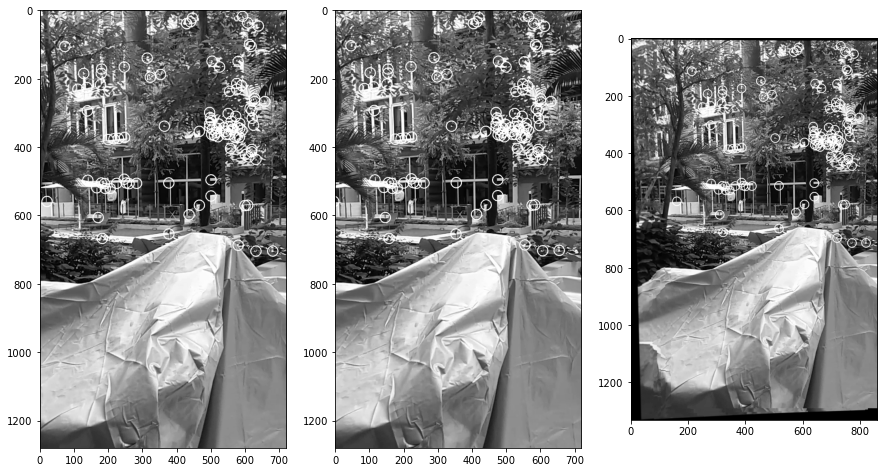

9 10


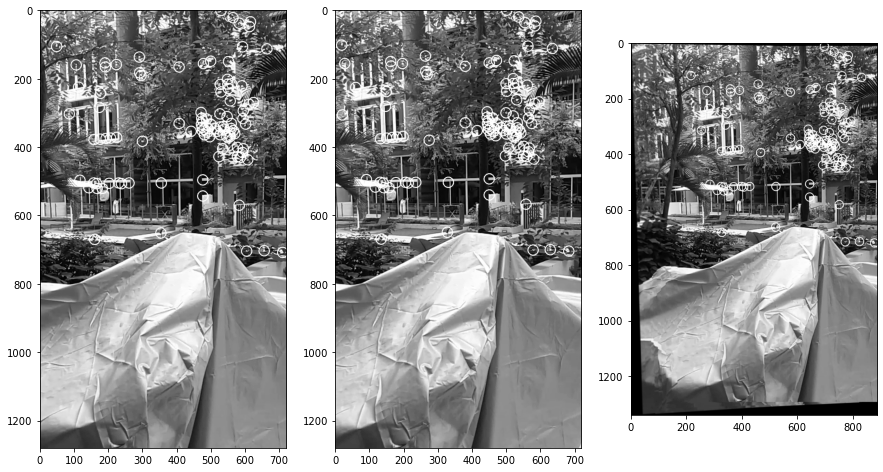

10 11


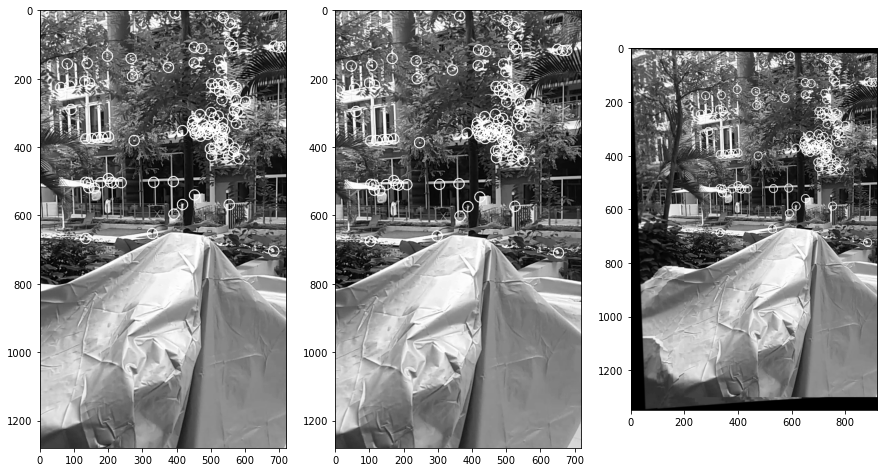

11 12


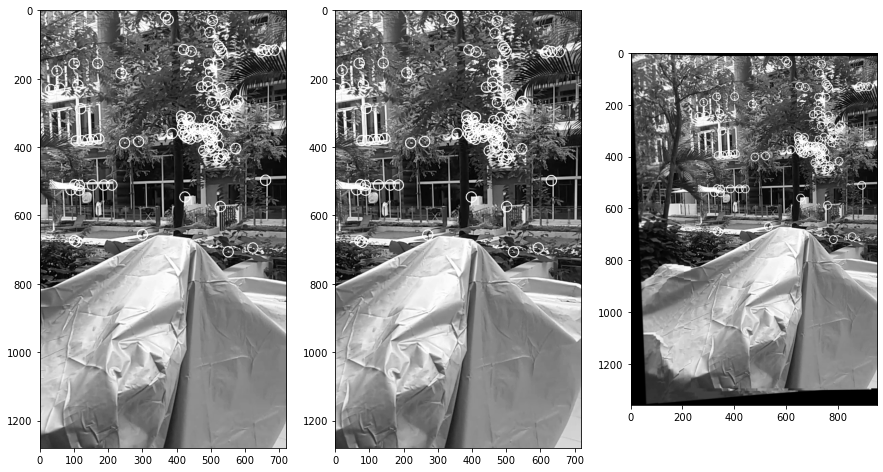

12 13


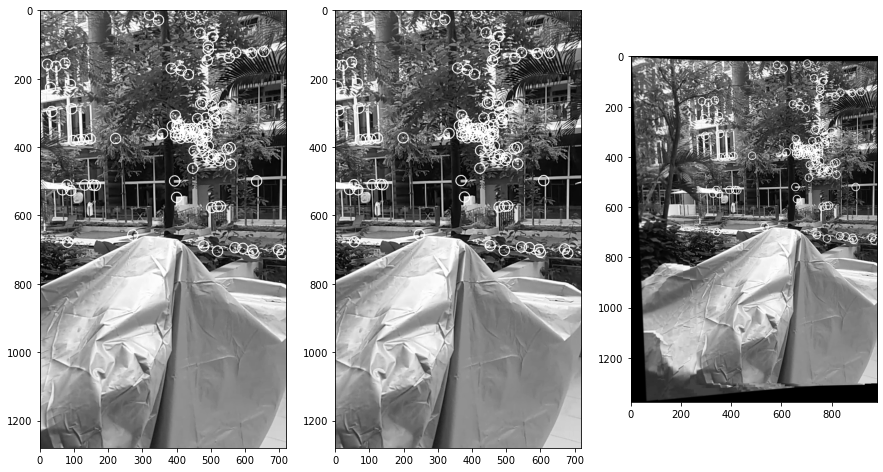

13 14


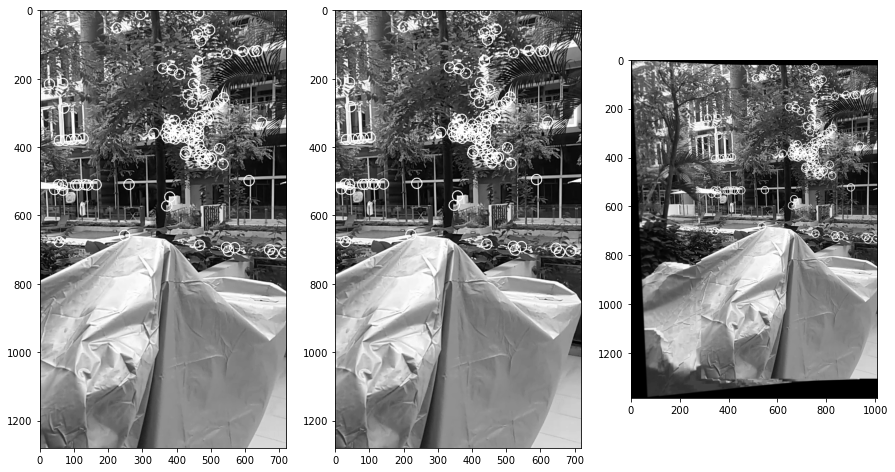

14 15


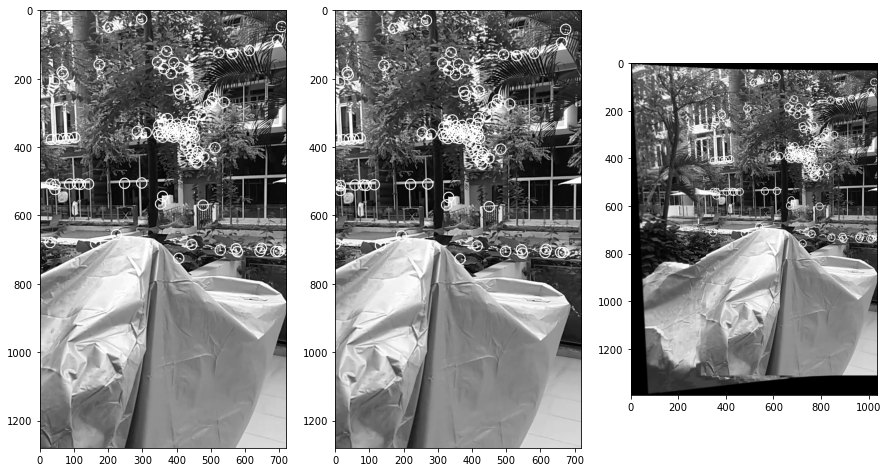

15 16


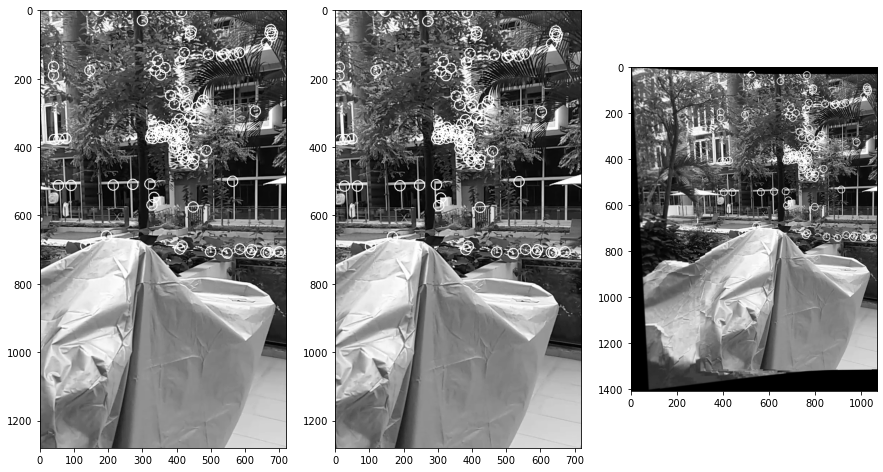

16 17


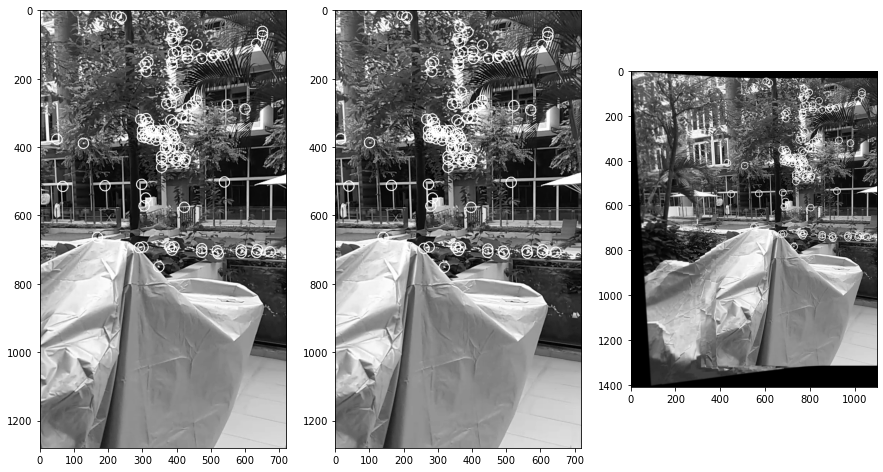

17 18


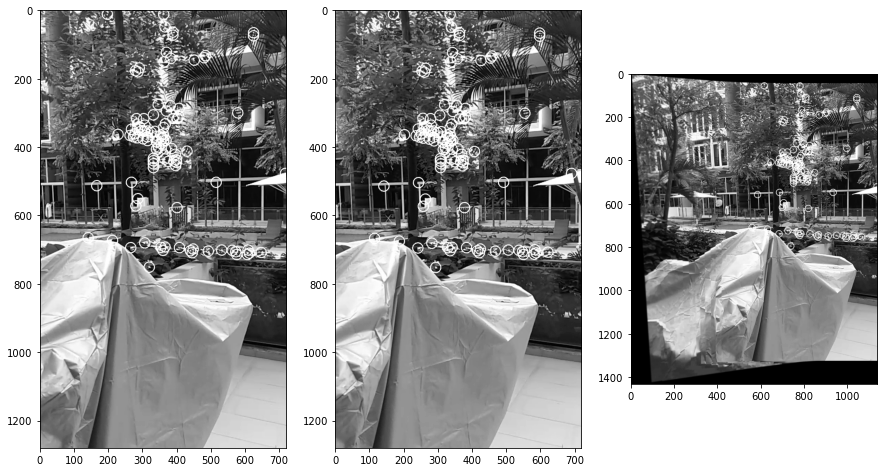

18 19


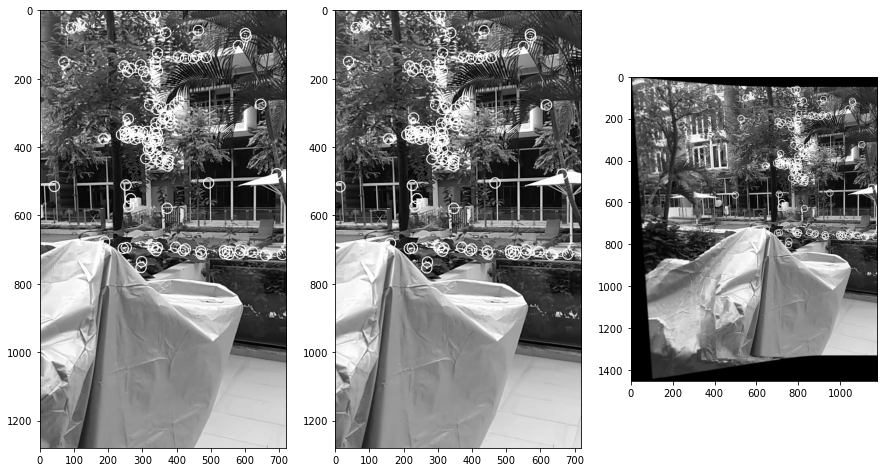

19 20


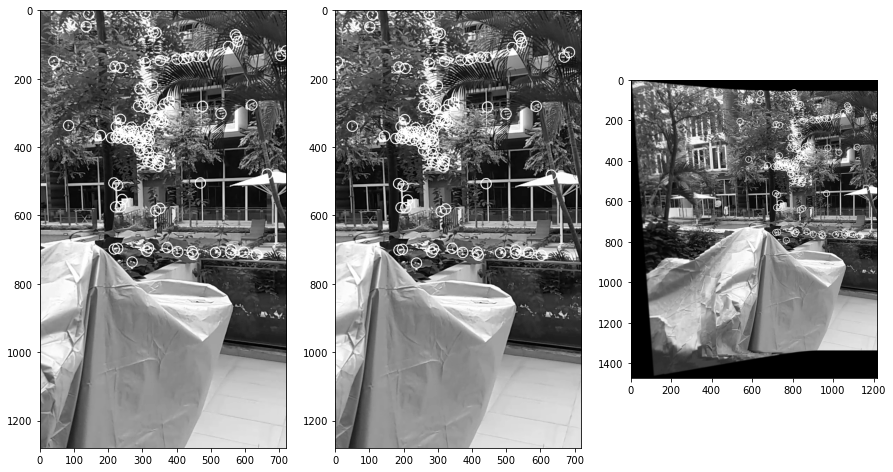

20 21


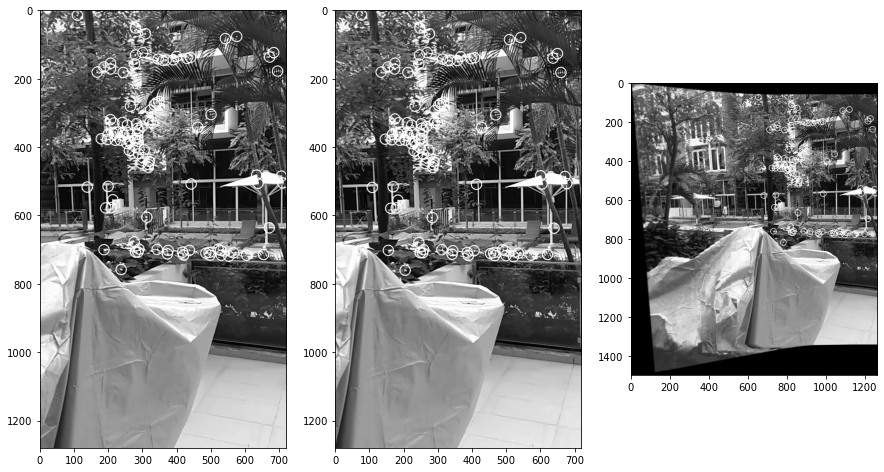

In [585]:
# warp img0/mosaic instead of img1
mosaic = None
rect=[0,0,0,0]

for i, j in zip(range(0, len(imgs)-1), range(1, len(imgs))):
    print(i, j)
    img0 = cv2.cvtColor(imgs[i],cv2.COLOR_BGR2GRAY)
    img1 = cv2.cvtColor(imgs[j],cv2.COLOR_BGR2GRAY)
    
    if mosaic is None:
        mosaic_crop = img0
        mosaic = img0
    else:
        mosaic_crop = mosaic[rect[0]:rect[1], rect[2]:rect[3]]
        

    #gftt
    # p0 = cv2.goodFeaturesToTrack(img0, mask = None, **feature_params)
    p0 = cv2.goodFeaturesToTrack(mosaic_crop, mask = None, **feature_params)

    #oflk
    p1, st, err = cv2.calcOpticalFlowPyrLK(mosaic_crop, img1, p0, None, **lk_params)
    # p1, st, err = cv2.calcOpticalFlowPyrLK(img1, mosaic_crop, p0, None, **lk_params)

    # good points
    good1 = p1[st==1]
    good0 = p0[st==1]
    
    _i = mosaic_crop.copy()
    for p in good0:
        cv2.circle(_i, tuple(p), 15, (255,0,0), 2)
    
    
    # translate back after crop
    MA = np.float32([[1, 0, rect[2]], [0, 1, rect[0]], [0,0,1]])
    good0_ = cv2.perspectiveTransform(good0.reshape(-1,1,2), MA)
    
    _j = mosaic.copy()
    for p in good0_.squeeze():
        cv2.circle(_j, tuple(p), 15, (255,0,0), 2)
        
    _k = img1.copy()
    for p in good1:
        cv2.circle(_k, tuple(p), 15, (255,0,0), 2)
        
    fig, ax = plt.subplots(1, 3, figsize=(15,15))
    ax[0].imshow(_i, cmap='gray')
    ax[1].imshow(_k, cmap='gray')
    ax[2].imshow(_j, cmap='gray')
    plt.show()
    
    M, mask = cv2.findHomography(good1, good0_.squeeze(), cv2.RANSAC, 5.0)
    M_Inv, mask = cv2.findHomography(good0_.squeeze(), good1, cv2.RANSAC, 5.0)

    result, rect = warpTwoImagesInv(mosaic, img1, M_Inv)
    # result, rect = warpTwoImages(mosaic, img1, M)
    # plt.figure(figsize=(9,16))
    # plt.imshow(result)
    # plt.show()
    mosaic = result
    if(i==20):
        break

In [581]:
cv2.imwrite("pano_162930_5.jpg", mosaic)

True